# Introduction
This tutorial demonstrates the basic procedure for performing Bayesian trajectory modeling using the *bayes_traj* python package. No knowledge of the python programming language is required. This notebook contains a mixture of code blocks python as well as invocation of command-line calls (signified by a leading ! character). The python code is primarily for loading data into the notebook and making plots. The command-line calls are of primary interest for actual tracjectory analysis.

We begin by loading some python packages required for reading data and making plots:

In [1]:
%matplotlib inline

import pandas as pd
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [8, 8]

# Data Preliminaries
### General comments about input data
* Tools expect data to be in csv (comma-separated value) format
* If an intercept term will be used as a predictor, the data set should contain a column of 1s
* There should be a subject identifier column (not strictly necessary, e.g. if your data is cross-sectional)
* bayes_traj uses '^' to indicate a predictor is being raised to a power and '\*' to indicate an interaction between two predictors. 

### Tutorial data description
We begin by reading in a synthetically generated data set that mimics biomarkers (y1 and y2) that decline with age. There are five trajectory subgroups in our data set: three with modest rates of decline but with varying intercepts, and two with accelerated rates of decline (also with varying intercepts). There are three visits for each individual in our data set, simulating a longitudinal study. The visits are spread 5 years apart. Subject "enrollment" is 45 - 80 years old. 

In [4]:
df = pd.read_csv('bayes_traj_tutorial_std-0.05_visits-3.csv')
pd.set_option('display.float_format', '{:.1f}'.format)
df.head(10)[['id', 'intercept', 'age', 'age^2', 'y1', 'y2']]

,id,intercept,age,age^2,y1,y2
0,1,1.0,68.2,4650.3,4.9,5.0
1,1,1.0,73.2,5357.2,5.0,4.9
2,1,1.0,78.2,6114.2,4.7,4.8
3,2,1.0,54.1,2931.0,5.3,5.2
4,2,1.0,59.1,3497.4,5.2,5.1
5,2,1.0,64.1,4113.7,5.0,5.1
6,3,1.0,58.3,3396.8,5.2,5.1
7,3,1.0,63.3,4004.7,5.0,5.0
8,3,1.0,68.3,4662.5,5.1,4.9
9,4,1.0,59.8,3575.5,5.1,5.0


Let's now visualize the data:

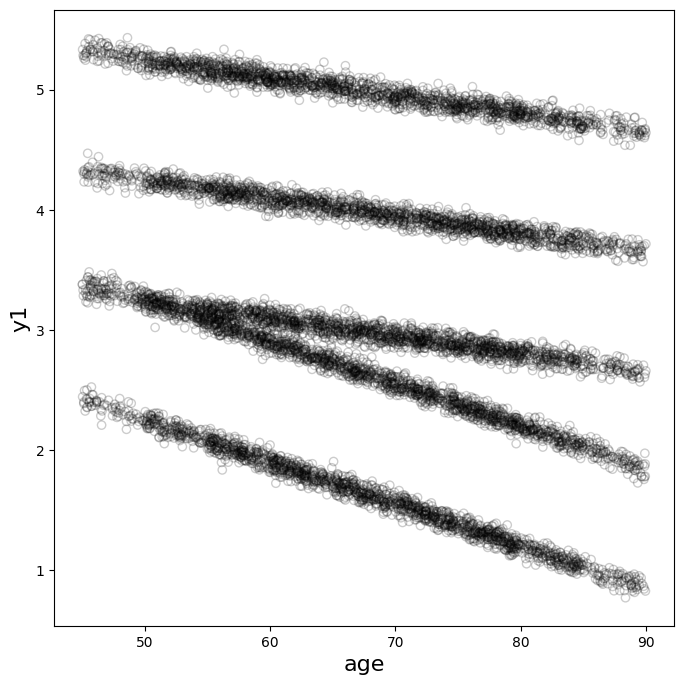

In [3]:
plt.scatter(df.age.values, df.y1.values, facecolor='none', edgecolor='k', alpha=0.2)
plt.xlabel('age', fontsize=16);
plt.ylabel('y1', fontsize=16);

This is a highly idealized data set. Working with such a data set initially has two purposes: 1) it makes clear what we are trying to achieve with trajectory analysis (namely, to identify subgroups and their characteristic progression patterns), and 2) it provides a "sanity check" that ensures the Bayesian trajectory tools produce the results we expect. We will explore more challenging data later in the tutorial.

# Generating Priors
Before we can perform Bayesian trajectory fitting to our data, we must first generate priors for the parameters in our model. The *bayes_traj* package provides two utilities for generating priors: *generate_prior* and *viz_data_prior_draws*. We can inspect tool usage by running each with the -h flag:

In [5]:
!generate_prior -h

usage: generate_prior [-h] [--preds PREDS] [--targets TARGETS]
                      [--out_file OUT_FILE]
                      [--tar_resid TAR_RESID [TAR_RESID ...]]
                      [--coef COEF [COEF ...]]
                      [--coef_std COEF_STD [COEF_STD ...]] [--in_data IN_DATA]
                      [--ranefs RANEFS] [--ranef RANEF [RANEF ...]]
                      [--est_ranefs] [--num_trajs NUM_TRAJS] [--model MODEL]
                      [--model_trajs MODEL_TRAJS] [--groupby <string>]
                      [--alpha <class 'float'>]

Generates a pickled file containing Bayesian trajectory prior information

options:
  -h, --help            show this help message and exit
  --preds PREDS         Comma-separated list of predictor names
  --targets TARGETS     Comma-separated list of target names
  --out_file OUT_FILE   Output (pickle) file that will contain the prior
  --tar_resid TAR_RESID [TAR_RESID ...]
                        Use this flag to specify the residual 

This utility can be used in a number of ways. If you have no prior knowledge about how to set values for the prior, you may wish to start by running the utility with very basic information, which can later be fine-tuned. (Note that by default, the generated prior assume no random effects).

Let's run this utility with some basic information: the target variable we wish to analyze (y1), the predictors we wish to use (intercert and age), and our data file.

In [9]:
!generate_prior --num_trajs 5 --preds intercept,age --targets y1 --in_data bayes_traj_tutorial_std-0.05_visits-3.csv  --out_file bayes_traj_tutorial_std-0.05_visits-3_prior_v1.p --groupby id

Reading data...
---------- Prior Info ----------
alpha: 5.92e-01
 
y1 residual (precision mean, precision variance):             (3.75e+00, 8.35e-02)
y1 intercept (mean, std): (5.10e+00, 5.03e-01)
y1 age (mean, std): (-2.74e-02, 7.46e-03)


By default, this utility makes a crude estimate of prior parameters.

The print-out provides information about how the prior has been set. The first value, 'alpha', captures our prior belief about how many trajectories are likely to exist in our data set. This value is determined by the number specified using the --num_trajs flag. Higher alpha values indicate more trajectories are likely to be in the data and vice versa (this value is always greater than zero). Note that the actual number of trajectories will be determined during the data fitting process; the specified number of trajectories only represents an expectation.

Next is the prior for the residual precision (1/variance). Following this are priors for the trajectory predictor coefficients.

Is this a good prior? Does it reflect our believe about trajectories that may be in our data? This can be difficult to assess with a numerical description. For a more visual assesment, we can use the 'viz_data_prior_draws' to produce random draws from this prior and overlay these with our data. Let's first look at usage by running with the -h flag:

In [10]:
!viz_data_prior_draws -h

usage: viz_data_prior_draws [-h] [--data_file DATA_FILE] [--prior PRIOR]
                            [--num_draws NUM_DRAWS] [--y_axis Y_AXIS]
                            [--y_label Y_LABEL] [--x_axis X_AXIS]
                            [--x_label X_LABEL] [--ylim YLIM] [--hide_resid]
                            [--fig_file FIG_FILE]

Produces a scatter plot of the data contained in the input data file as well
as plots of random draws from the prior. This is useful to inspect whether the
prior appropriately captures prior belief.

options:
  -h, --help            show this help message and exit
  --data_file DATA_FILE
                        Input data file
  --prior PRIOR         Input prior file
  --num_draws NUM_DRAWS
                        Number of random draws to take from prior
  --y_axis Y_AXIS       Name of the target variable that will be plotted on
                        the y-axis
  --y_label Y_LABEL     Label to display on y-axis. If none given, the
                     

Saving figure...
Writing provenance info...
DONE.


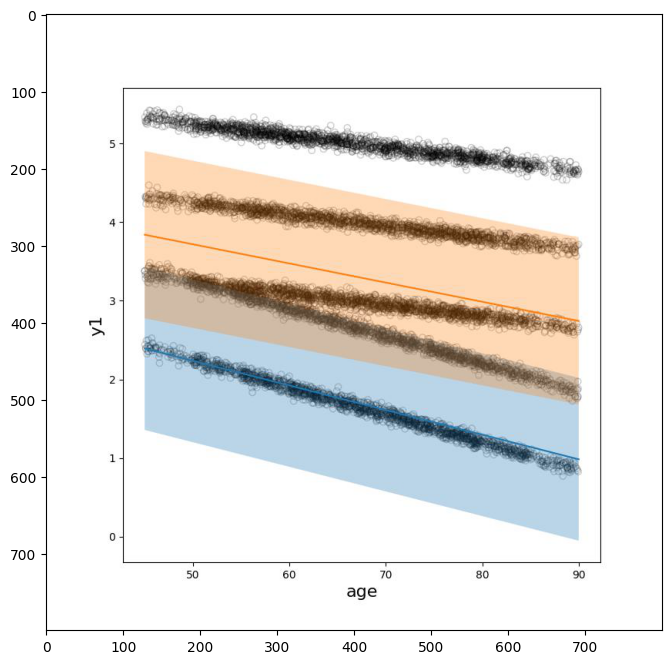

In [13]:
!viz_data_prior_draws --data_file bayes_traj_tutorial_std-0.05_visits-3.csv --prior bayes_traj_tutorial_std-0.05_visits-3_prior_v1.p --num_draws 2 --x_axis age  --y_axis y1 --fig_file bayes_traj_tutorial_std-0.05_visits-3_prior_v1_draws.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.05_visits-3_prior_v1_draws.jpg')
plt.imshow(prior_draws_fig)

Shown are two random draw from our prior over trajectories. The solid, colored lines represent the mean trend of randomly selected trajectories, and the shaded regions reflect the prior belief about the residual spread around each trajectory.

There are some issues with this first-pass prior: the prior for residual variances (shaded regions), is much too large. Also, the variability in intercepts does not appear to be high enough to adequately represent our data.

Let's rerun generate_prior, but this time will specify a higher residual precision (i.e., lower residual standard deviation value). Because we are dealing with a synthetically generated data set, we know *a priori* what the residual standard deviation is for each trajectory (we set it when we created the data!). In practice, you will need to use trial-and-error to select a value that best captures your belief.

We will use the --tar_resid flag to over-ride the default residual prior settings:

In [14]:
!generate_prior --num_trajs 5 --preds intercept,age --targets y1 --in_data bayes_traj_tutorial_std-0.05_visits-3.csv --out_file bayes_traj_tutorial_std-0.05_visits-3_prior_v2.p --groupby id --tar_resid y1,400,1e-5

Reading data...
---------- Prior Info ----------
alpha: 5.92e-01
 
y1 residual (precision mean, precision variance):             (4.00e+02, 1.00e-05)
y1 intercept (mean, std): (5.10e+00, 5.03e-01)
y1 age (mean, std): (-2.74e-02, 7.46e-03)


As before, let's visualize some random draws from this prior to see how things look:

Saving figure...
Writing provenance info...
DONE.


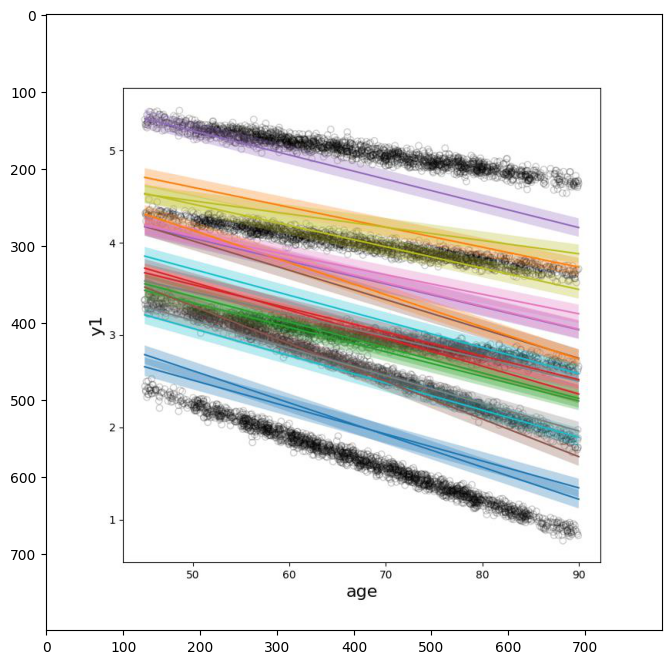

In [15]:
!viz_data_prior_draws --data_file bayes_traj_tutorial_std-0.05_visits-3.csv --prior bayes_traj_tutorial_std-0.05_visits-3_prior_v2.p --num_draws 20 --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.05_visits-3_prior_v2_draws.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.05_visits-3_prior_v2_draws.jpg')
plt.imshow(prior_draws_fig)

Now our prior over the residual variance seems reasonable. We can further improve the prior by overriding the settings for the intercept using the --coef_std flag. Let's see how this works:

In [16]:
!generate_prior --num_trajs 5 --preds intercept,age --targets y1 --in_data bayes_traj_tutorial_std-0.05_visits-3.csv --out_file bayes_traj_tutorial_std-0.05_visits-3_prior_v3.p --groupby id --tar_resid y1,400,1e-5 --coef_std y1,intercept,1 

Reading data...
---------- Prior Info ----------
alpha: 5.92e-01
 
y1 residual (precision mean, precision variance):             (4.00e+02, 1.00e-05)
y1 intercept (mean, std): (5.10e+00, 1.00e+00)
y1 age (mean, std): (-2.74e-02, 7.46e-03)


Now our prior over the intercept has been adjusted from a Gaussian distribution with a mean of 5.1 and a standard deviation of 0.074 to a mean of 5.1 and standard deviation of 1. Let's again look at some draws from the prior:

Saving figure...
Writing provenance info...
DONE.


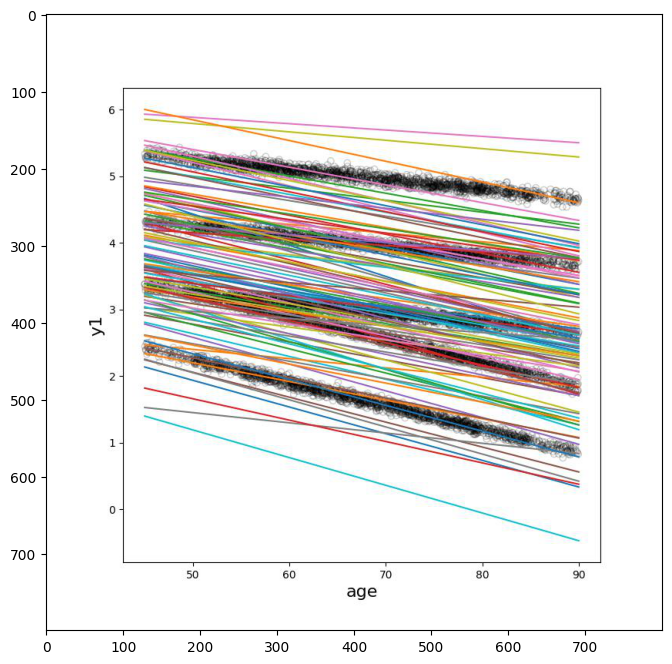

In [17]:
!viz_data_prior_draws --data_file bayes_traj_tutorial_std-0.05_visits-3.csv --prior bayes_traj_tutorial_std-0.05_visits-3_prior_v3.p --num_draws 100 --hide_resid --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.05_visits-3_prior_v3_draws.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.05_visits-3_prior_v3_draws.jpg')
plt.imshow(prior_draws_fig)

The increased variance for the intercept coefficient now better captures what we observe in our data. We could further tweak the prior by adjusting the coefficient for 'age' (i.e. the slope), but the trajectory subgroups are so well delineated in this idealized data set, the fitting routine should have no problem with this prior.

Now that we have a reasonable prior, we can proceed with the actual Bayesian trajectory fitting and analysis.

# Bayesian Trajectory Analysis: Continuous Target Variables
Now that we have generated a prior for our data set, we are ready to perform Bayesian trajectory fitting. First we demonstrate trajectory analysis in the case of continuous target variables. In this case, the algorithm assumes that the residuals around each trajectory are normally distributed.

### *bayes_traj_main*
The fitting routine is invoked with the *bayes_traj_main* utility. Let's run it with the -h flag to see what inputs are required:

In [18]:
!bayes_traj_main -h

usage: bayes_traj_main [-h] --in_csv <string> --targets <string>
                       [--groupby <string>] [--out_csv <string>] --prior
                       <string> [--prec_prior_weight <float>]
                       [--alpha <class 'float'>] [--out_model <string>]
                       [--iters <int>] [--repeats <int>] [-k <int>]
                       [--prob_thresh <float>] [--num_init_trajs <int>]
                       [--verbose] [--probs_weight <float>] [--weights_only]

Runs Bayesian trajectory analysis on the specified data file with the
specified predictors and target variables

options:
  -h, --help            show this help message and exit
  --in_csv <string>     Input csv file containing data on which to run
                        Bayesian trajectory analysis
  --targets <string>    Comma-separated list of target names. Must appear as
                        column names of the input data file.

                        instances that must be in the same trajectory

We will run the fitting routine by specifying our data set, the prior we generated, and the targets and predictors we are interested in analyzing. Also, it is important to use the *groupby* flag to indicate the column name in your data set that contains the subject identifier information.

In [24]:
!bayes_traj_main --in_csv bayes_traj_tutorial_std-0.05_visits-3.csv --prior bayes_traj_tutorial_std-0.05_visits-3_prior_v3.p  --targets y1 --groupby id --iters 150 --verbose --out_model bayes_traj_tutorial_std-0.05_visits-3_model_v1.p  --num_init_trajs 5

Reading prior...
Reading data...
Fitting...
Initializing parameters...
iter 1, [4291.2  118.4  194.1    0.    70.  4326.2    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 2, [2354.6  303.2  122.7    0.  4046.7 2172.7    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 3, [ 580.  1873.5   45.1    0.  3468.5 3032.8    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 4, [1265.5 2778.6  318.6    0.  2302.8 2334.5    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 5, [1794.1 2847.   758.9    0.  1800.  1800.

iter 39, [1800.  2079.5 1520.5    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 40, [1800.  2072.8 1527.2    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 41, [1800. 2066. 1534.    0. 1800. 1800.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.]
iter 42, [1800.  2059.1 1540.9    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 43, [1800.  2052.1 1547.9    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     

iter 77, [1800.  1902.6 1697.4    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 78, [1800.  1899.5 1700.5    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 79, [1800.  1896.5 1703.5    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 80, [1800.  1893.5 1706.5    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 81, [1800.  1890.4 1709.6    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.   

iter 115, [1800.  1814.9 1785.1    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 116, [1800.  1814.1 1785.9    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 117, [1800.  1813.2 1786.8    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 118, [1800.  1812.4 1787.6    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 119, [1800.  1811.7 1788.3    0.  1800.  1800.     0.     0.     0.     0.     0.     0.     0.     0.     

### *viz_model_trajs*
Now that we have saved the model to file, we can use another utility, viz_model_trajs, to visually inspect the results. First run with the -h flag to see the inputs:

In [25]:
!viz_model_trajs -h

usage: viz_model_trajs [-h] --model MODEL --y_axis Y_AXIS [--y_label Y_LABEL]
                       --x_axis X_AXIS [--x_label X_LABEL] [--trajs TRAJS]
                       [--min_traj_prob MIN_TRAJ_PROB]
                       [--max_traj_prob MAX_TRAJ_PROB] [--fig_file FIG_FILE]
                       [--traj_map TRAJ_MAP] [--xlim XLIM] [--ylim YLIM]
                       [--hs] [--htd] [--traj_markers TRAJ_MARKERS]
                       [--traj_colors TRAJ_COLORS] [--fill_alpha FILL_ALPHA]

options:
  -h, --help            show this help message and exit
  --model MODEL         Model containing trajectories to visualize
  --y_axis Y_AXIS       Name of the target variable that will be plotted on
                        the y-axis
  --y_label Y_LABEL     Label to display on y-axis. If none given, the
                        variable name specified with the y_axis flag will be
                        used.
  --x_axis X_AXIS       Name of the predictor variable that will be plotted

Saving figure...
Writing provenance info...
DONE.


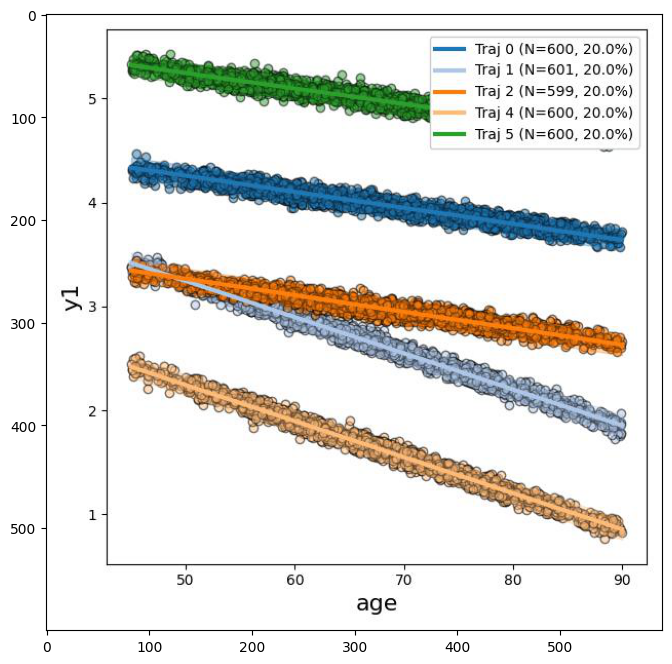

In [27]:
!viz_model_trajs --model bayes_traj_tutorial_std-0.05_visits-3_model_v1.p --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.05_visits-3_model_v1_fig.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.05_visits-3_model_v1_fig.jpg')
plt.imshow(prior_draws_fig)

Shown are the average trends (solid lines) identified by the algorithm together with shaded regions indicating the estimated residual precision values. Data points are color-coded based on which trajectory groub they most probably belong to.

# Trajectory Modeling with Noisy, Continuous Data
Now that we have generated a trajectory model that we are happy with, we may wish to use this model to inform trajectory analysis in another data set. In this section we will analyze a much noisier data set than above. We will begin by plotting this data set.

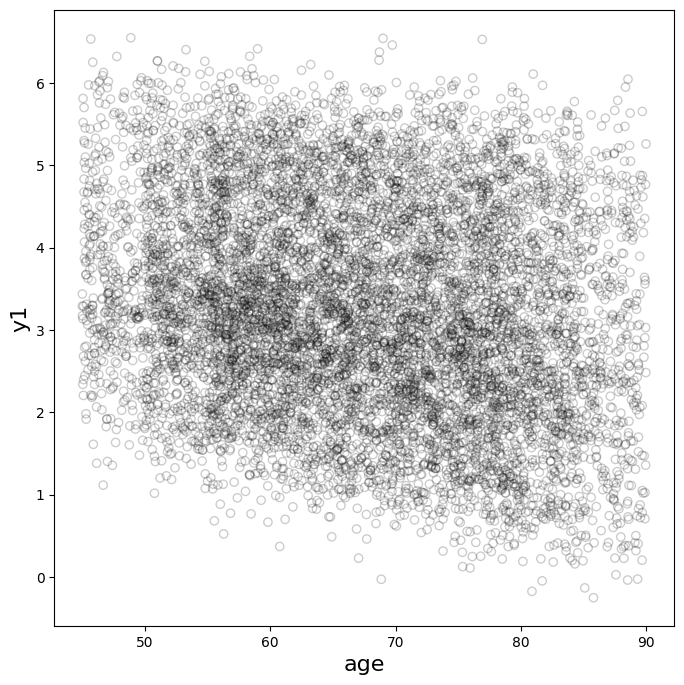

In [28]:
df2 = pd.read_csv('bayes_traj_tutorial_std-0.5_visits-3.csv')
plt.scatter(df2.age.values, df2.y1.values, facecolor='none', edgecolor='k', alpha=0.2)
plt.xlabel('age', fontsize=16);
plt.ylabel('y1', fontsize=16);

This is also a synthetically generated data set, and -- except for the noise level -- has the same characteristics as the data set we worked with above (e.g. five trajectories, three "visits" per "individual" and so on). As before we start with a prior.

### *generate_prior*: new data
There is no reason why we couldn't use our previously generated prior straight-away to perform trajectory analysis in this data set. However, the data fitting we performed above has presumably refined our knowledge about the trajectories we are likely to encounter in this new data set. As such, we can provide the previously fit model as an input to *generate_prior* so that it can inform the generation of a new prior for our current data set (effectively, we are using the *posterior* of our previously fit model to inform the *prior* for our current data).

Let's see how this works:

In [29]:
!generate_prior --preds intercept,age --targets y1 --out_file bayes_traj_tutorial_std-0.5_visits-3_prior_v1.p --model bayes_traj_tutorial_std-0.05_visits-3_model_v1.p 

Reading model...
---------- Prior Info ----------
alpha: 5.92e-01
 
y1 residual (precision mean, precision variance):             (4.00e+02, 5.95e-13)
y1 intercept (mean, std): (4.81e+00, 4.73e-01)
y1 age (mean, std): (-2.31e-02, 4.65e-03)


As before, let's visualize some random draws from this prior to see how the look with respect to our new data:

Saving figure...
Writing provenance info...
DONE.


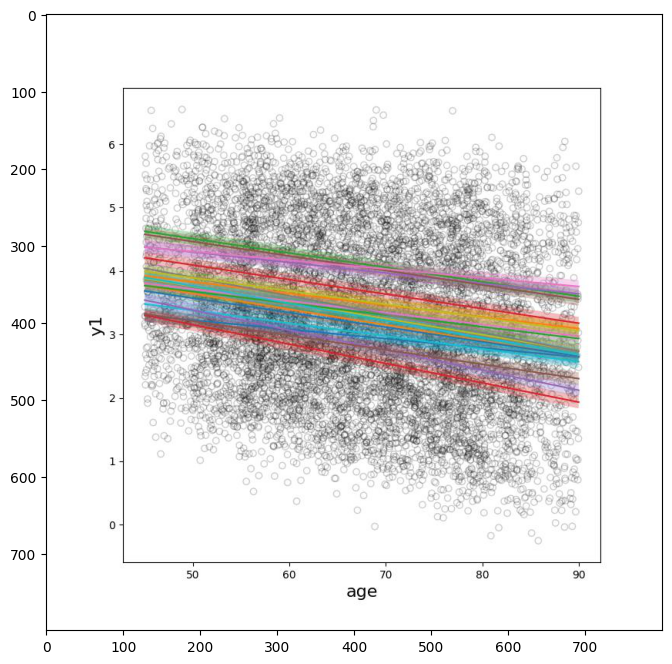

In [30]:
!viz_data_prior_draws --data_file bayes_traj_tutorial_std-0.5_visits-3.csv --prior bayes_traj_tutorial_std-0.5_visits-3_prior_v1.p --num_draws 20 --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.5_visits-3_prior_v1_draws.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_prior_v1_draws.jpg')
plt.imshow(prior_draws_fig)

There are a few points to note:
* We did not explicitly define settings for the intercept or residual priors. These were gleamed from the input model.
* The spread in intercept and slope appear reasonable.
* The residual precision (1/variance) is apparently too high for this data.

Given that the characteristics of our new data may be significantly different than the characteristics of the data on which the previous model was fit, we always have the option to specifically indicate what the varios prior settings should be. For example, here we have good reason to believe that the residual precision should be lower. As such, we can re-generate the prior and specifically set the residual precsion:

In [32]:
!generate_prior --preds intercept,age --targets y1 --out_file bayes_traj_tutorial_std-0.5_visits-3_prior_v2.p --model bayes_traj_tutorial_std-0.05_visits-3_model_v1.p --groupby id --tar_resid y1,4,0.01 

Reading model...
---------- Prior Info ----------
alpha: 5.92e-01
 
y1 residual (precision mean, precision variance):             (4.00e+00, 1.00e-02)
y1 intercept (mean, std): (4.81e+00, 4.73e-01)
y1 age (mean, std): (-2.31e-02, 4.65e-03)


Again, visualize random draws from this prior to evaluate these settings:

Saving figure...
Writing provenance info...
DONE.


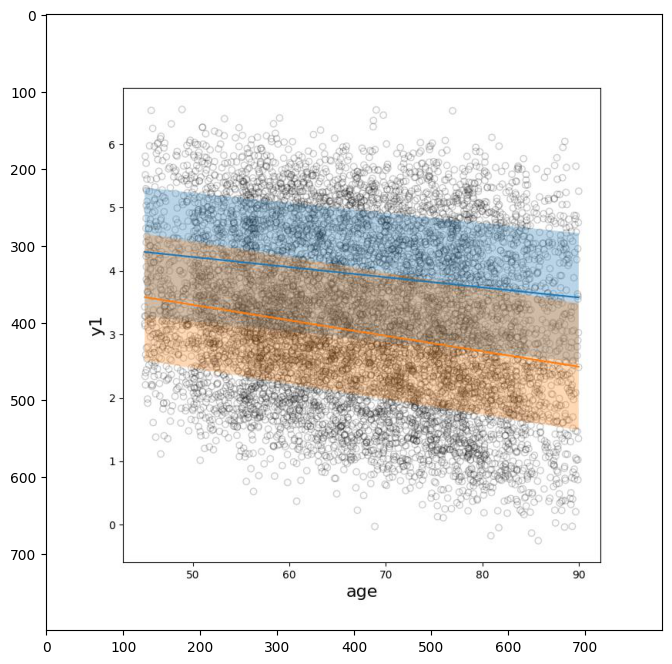

In [33]:
!viz_data_prior_draws --data_file bayes_traj_tutorial_std-0.5_visits-3.csv --prior bayes_traj_tutorial_std-0.5_visits-3_prior_v2.p --num_draws 2 --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.5_visits-3_prior_v2_draws.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_prior_v2_draws.jpg')
plt.imshow(prior_draws_fig)

Looks reasonable. Now let's see how well the trajectory fitting routine works on this data set with this prior...

### *bayes_traj_main*: new data
Bayesian trajectory fitting proceeds exactly as before with the exception that we now set the --probs_weight flag. Since the prior was generated from a previously fit model, the prior file contains the trajectory shapes as well as the trajectory proportions from that data fit. When we use this prior on a new data set, we can tell bayes_traj_main how much weight to give to those previously determined trajectories on initialization; the fitting routine will then refine trajectory shapes and proportions using the data provided.

In [34]:
!bayes_traj_main --in_csv bayes_traj_tutorial_std-0.5_visits-3.csv --prior bayes_traj_tutorial_std-0.5_visits-3_prior_v2.p  --targets y1 --groupby id --iters 150 --verbose --out_model bayes_traj_tutorial_std-0.5_visits-3_model_v1.p --probs_weight 1

Reading prior...
Using K=30 (from prior)
Reading data...
Fitting...
Initializing parameters...
iter 1, [1761.6 1860.4 1752.9    0.  1858.5 1766.6    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 2, [1675.2 1993.6 1643.1    0.  1986.7 1701.4    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 3, [1525.8 2189.7 1388.     0.  2172.  1724.6    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 4, [1197.  2417.7  955.1    0.  2387.5 2042.7    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 5, [ 898.2 2469.6 11

iter 38, [1819.8 1803.3 1779.4    0.  1766.  1831.6    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 39, [1820.  1803.  1783.4    0.  1762.1 1831.6    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 40, [1820.1 1802.7 1787.1    0.  1758.6 1831.5    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 41, [1820.2 1802.5 1790.6    0.  1755.2 1831.5    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 42, [1820.3 1802.2 1793.8    0.  1752.2 1831.5    0.     0.     0.     0.     0.     0.     0.     0.     0.   

iter 76, [1819.9 1796.7 1839.6    0.  1713.6 1830.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 77, [1819.9 1796.6 1840.1    0.  1713.2 1830.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 78, [1819.8 1796.5 1840.7    0.  1712.9 1830.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 79, [1819.8 1796.4 1841.2    0.  1712.6 1830.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 80, [1819.7 1796.3 1841.7    0.  1712.3 1830.     0.     0.     0.     0.     0.     0.     0.     0.     0.   

iter 114, [1817.5 1793.1 1852.8    0.  1707.6 1829.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 115, [1817.5 1793.  1853.     0.  1707.5 1829.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 116, [1817.4 1792.9 1853.3    0.  1707.5 1828.9    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 117, [1817.3 1792.9 1853.5    0.  1707.4 1828.9    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 118, [1817.3 1792.8 1853.7    0.  1707.4 1828.9    0.     0.     0.     0.     0.     0.     0.     0.     

Saving model provenance info...
DONE.


As before, let's visualize the trajectories:

Saving figure...
Writing provenance info...
DONE.


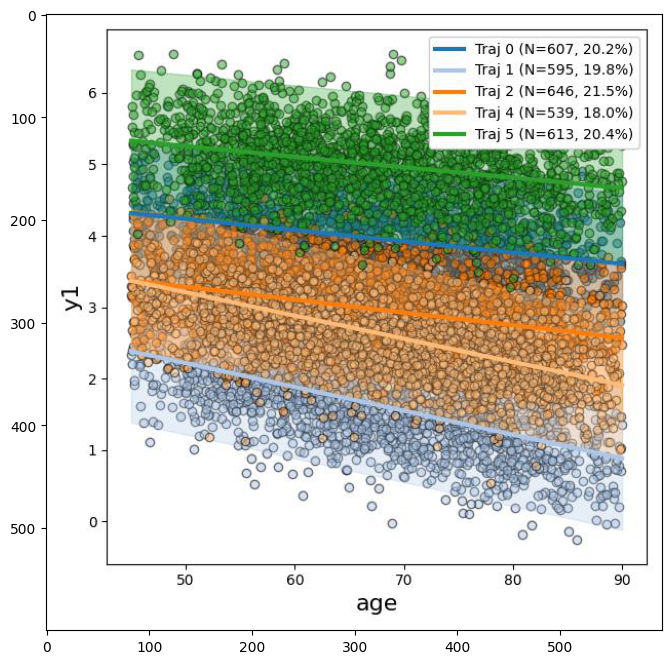

In [35]:
!viz_model_trajs --model bayes_traj_tutorial_std-0.5_visits-3_model_v1.p --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.5_visits-3_model_v1_fig.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_model_v1_fig.jpg')
plt.imshow(prior_draws_fig)

This is a challenging data set. Although this data set was created with 5 different trajectories, the noise level is high, making it challenging to identify them. Here we benefited from a prior informed by a previously fit model. 

### New data, multiple dimensions
Instead of performing trajectory analysis on a single target variable (e.g. y1), we can identify trajectory subgroups by considering progression patterns in multiple dimensions, here y1 *and* y2. 

Let's begin by plotting both y1 and y2 vs age for our new data set.

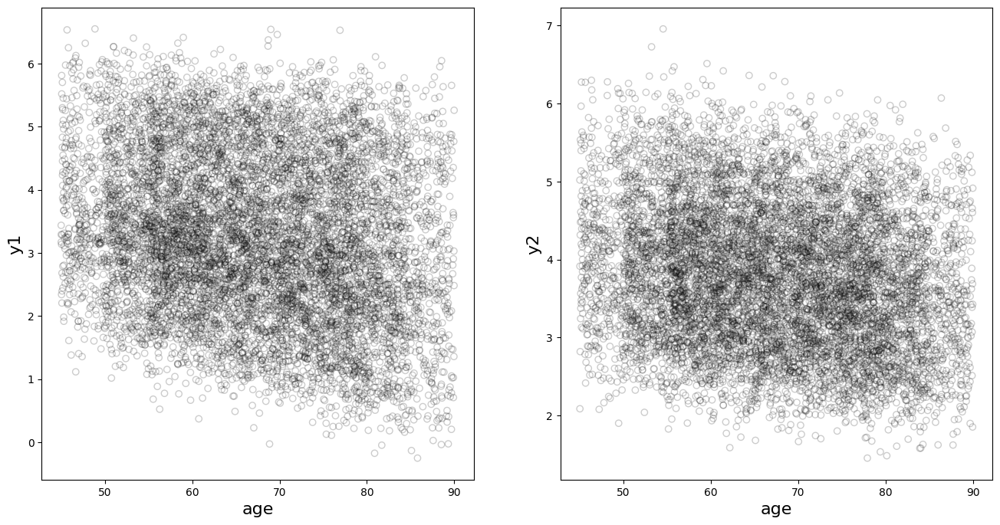

In [41]:
df2 = pd.read_csv('bayes_traj_tutorial_std-0.5_visits-3.csv')
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
axes[0].scatter(df2.age.values, df2.y1.values, facecolor='none', edgecolor='k', alpha=0.2)
axes[1].scatter(df2.age.values, df2.y2.values, facecolor='none', edgecolor='k', alpha=0.2)
axes[0].set_xlabel('age', fontsize=16);
axes[1].set_xlabel('age', fontsize=16);
axes[0].set_ylabel('y1', fontsize=16);
axes[1].set_ylabel('y2', fontsize=16);

As before, we begin by generating a prior.

### *generate_prior*: new data, multiple dimensions
We will use our previously generated model as before. Recall that we specifically set the prior over the y1 residual precision. Given that y2 visually appears to have similar data characteristics, a reasonable place to start is to specify the same prior for the y2 residuals.

In [42]:
!generate_prior --in_data bayes_traj_tutorial_std-0.5_visits-3.csv --preds intercept,age --targets y1,y2 --groupby id --out_file bayes_traj_tutorial_std-0.5_visits-3_prior_v3.p --tar_resid y1,4,0.01 --tar_resid y2,4,0.01

Reading data...
---------- Prior Info ----------
alpha: 3.31e-01
 
y1 residual (precision mean, precision variance):             (4.00e+00, 1.00e-02)
y1 intercept (mean, std): (4.92e+00, 5.49e-01)
y1 age (mean, std): (-2.47e-02, 8.20e-03)
 
y2 residual (precision mean, precision variance):             (4.00e+00, 1.00e-02)
y2 intercept (mean, std): (4.84e+00, 3.93e-01)
y2 age (mean, std): (-1.56e-02, 5.76e-03)


Again, visualize random draws from our prior overlayed on our data. Now that we are considering multiple output dimensions, we should look at draws for both y1 and y2:

Saving figure...
Writing provenance info...
DONE.


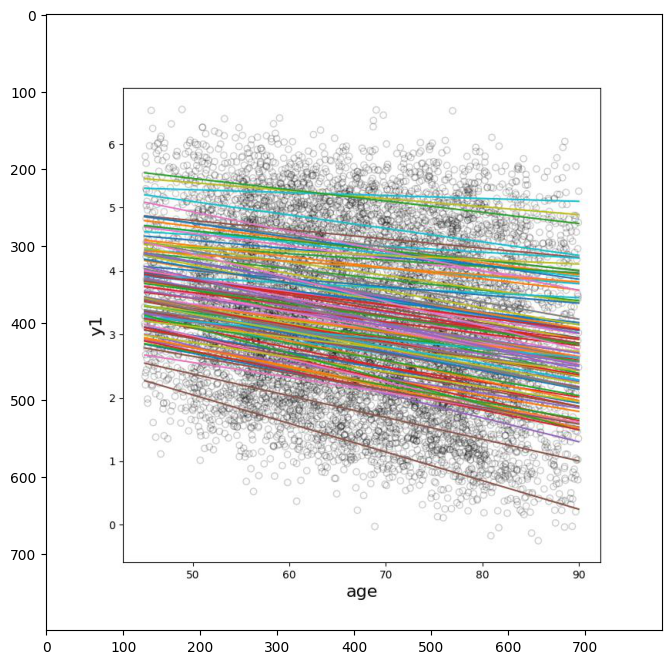

In [43]:
!viz_data_prior_draws --data_file bayes_traj_tutorial_std-0.5_visits-3.csv --prior bayes_traj_tutorial_std-0.5_visits-3_prior_v3.p --num_draws 100 --hide_resid --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.5_visits-3_prior_v3_y1_draws.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_prior_v3_y1_draws.jpg')
plt.imshow(prior_draws_fig)

Saving figure...
Writing provenance info...
DONE.


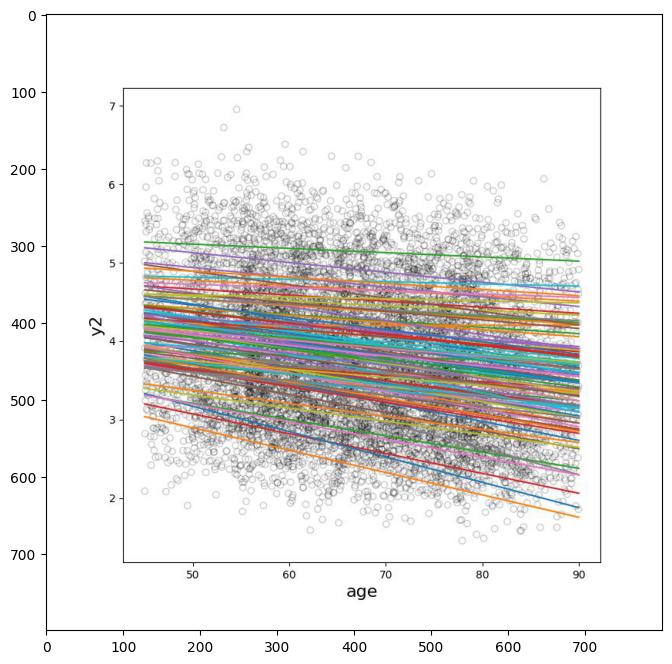

In [44]:
!viz_data_prior_draws --data_file bayes_traj_tutorial_std-0.5_visits-3.csv --prior bayes_traj_tutorial_std-0.5_visits-3_prior_v3.p --num_draws 100 --x_axis age --y_axis y2 --hide_resid --fig_file bayes_traj_tutorial_std-0.5_visits-3_prior_v3_y2_draws.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_prior_v3_y2_draws.jpg')
plt.imshow(prior_draws_fig)

### *bayes_traj_main*: new data, multiple dimensions
Trajectory fitting proceeds as before. We specify the newly generated prior and also indicate that we want trajectories defined with respect to y1 *and* y2. 

In [47]:
!bayes_traj_main --in_csv bayes_traj_tutorial_std-0.5_visits-3.csv --prior bayes_traj_tutorial_std-0.5_visits-3_prior_v3.p  --targets y1,y2 --groupby id --iters 150 --verbose --out_model bayes_traj_tutorial_std-0.5_visits-3_model_v2.p --num_init_trajs 5

Reading prior...
Reading data...
Fitting...
Initializing parameters...
iter 1, [8307.1   92.   545.1   22.3   33.5    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 2, [8202.1  109.2  639.8   19.6   29.3    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 3, [7943.6  147.8  866.7   16.3   25.6    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 4, [7450.7  226.9 1289.1   12.3   21.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 5, [6877.4  347.6 1749.     9.7   16.3    0.

iter 38, [1776.5 1857.6 1798.5 1819.3 1748.2    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 39, [1776.5 1856.5 1798.4 1819.6 1749.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 40, [1776.6 1855.4 1798.4 1819.9 1749.7    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 41, [1776.6 1854.4 1798.4 1820.2 1750.4    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 42, [1776.7 1853.4 1798.4 1820.5 1751.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.   

iter 76, [1778.1 1831.6 1798.4 1826.8 1765.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 77, [1778.1 1831.2 1798.4 1826.9 1765.4    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 78, [1778.1 1830.8 1798.4 1827.  1765.7    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 79, [1778.1 1830.4 1798.4 1827.1 1765.9    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 80, [1778.2 1830.1 1798.4 1827.2 1766.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.   

iter 114, [1778.8 1821.  1798.4 1829.9 1771.9    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 115, [1778.9 1820.8 1798.4 1829.9 1772.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 116, [1778.9 1820.6 1798.4 1830.  1772.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 117, [1778.9 1820.5 1798.4 1830.  1772.2    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 118, [1778.9 1820.3 1798.4 1830.1 1772.3    0.     0.     0.     0.     0.     0.     0.     0.     0.     

Saving model provenance info...
Traceback (most recent call last):
  File "/opt/anaconda3/envs/pyro_env/bin/bayes_traj_main", line 33, in <module>
    sys.exit(load_entry_point('bayes-traj', 'console_scripts', 'bayes_traj_main')())
  File "/Users/jr555/Downloads/bayes_traj/bayes_traj/bayes_traj_main.py", line 286, in main
    write_provenance_data(op.out_model, generator_args=op,
  File "/opt/anaconda3/envs/pyro_env/lib/python3.10/site-packages/provenance_tools/write_provenance_data.py", line 184, in write_provenance_data
    raise RuntimeError('Repository not up-to-date')
RuntimeError: Repository not up-to-date


Plot the trajectories for both y1 and y2 to assess the fit:

Saving figure...
Writing provenance info...
DONE.


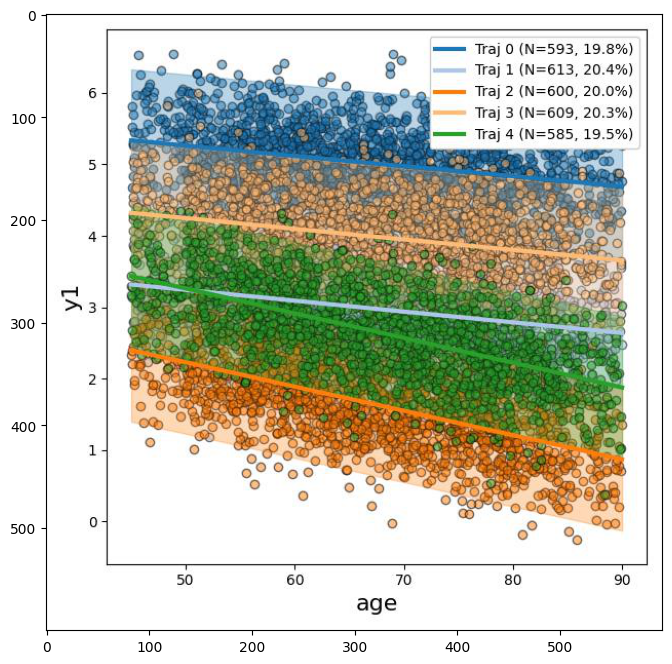

In [49]:
!viz_model_trajs --model bayes_traj_tutorial_std-0.5_visits-3_model_v2.p --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.5_visits-3_model_v2_y1_fig.jpg 

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_model_v2_y1_fig.jpg')
plt.imshow(prior_draws_fig)

Saving figure...
Writing provenance info...
DONE.


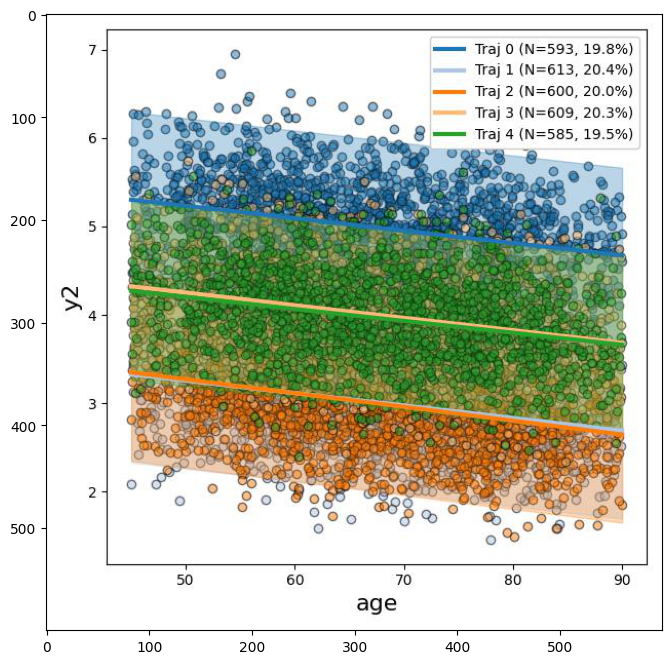

In [50]:
!viz_model_trajs --model bayes_traj_tutorial_std-0.5_visits-3_model_v2.p --x_axis age --y_axis y2 --fig_file bayes_traj_tutorial_std-0.5_visits-3_model_v2_y2_fig.jpg 

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_model_v2_y2_fig.jpg')
plt.imshow(prior_draws_fig)

The addition of y2 improves the ability of the trajectory algorithm to recover the underlying population structure. 

Note that the fitting routine begins with a *random initialization*. For this particular data set and prior, multiple invocations of the fitting routine may result in different trajectory fit results. In practice, it is advised to generate multiple models for a given prior. Comparing these models both qualitatively and quantitatively can help identify spurious and stable trajectory subgroups.

# Model Comparison

At this point, we may be wondering if we can produce a better fit using a different predictor set. For example, what if we include age^2 as an additional predictor?

The basic steps should now be familiar. Start by generating a prior:

### *generate_prior*: new data, multiple dimensions, different predictors

In [51]:
!generate_prior --in_data bayes_traj_tutorial_std-0.5_visits-3.csv --preds intercept,age,age^2 --targets y1,y2 --out_file bayes_traj_tutorial_std-0.5_visits-3_prior_v4.p  --tar_resid y1,4,0.01 --tar_resid y2,4,0.01

Reading data...
---------- Prior Info ----------
alpha: 2.91e-01
 
y1 residual (precision mean, precision variance):             (4.00e+00, 1.00e-02)
y1 intercept (mean, std): (4.86e+00, 3.21e+00)
y1 age (mean, std): (-2.30e-02, 9.78e-02)
y1 age^2 (mean, std): (-1.25e-05, 7.31e-04)
 
y2 residual (precision mean, precision variance):             (4.00e+00, 1.00e-02)
y2 intercept (mean, std): (4.91e+00, 2.29e+00)
y2 age (mean, std): (-1.77e-02, 6.90e-02)
y2 age^2 (mean, std): (1.59e-05, 5.10e-04)


Saving figure...
Writing provenance info...
DONE.


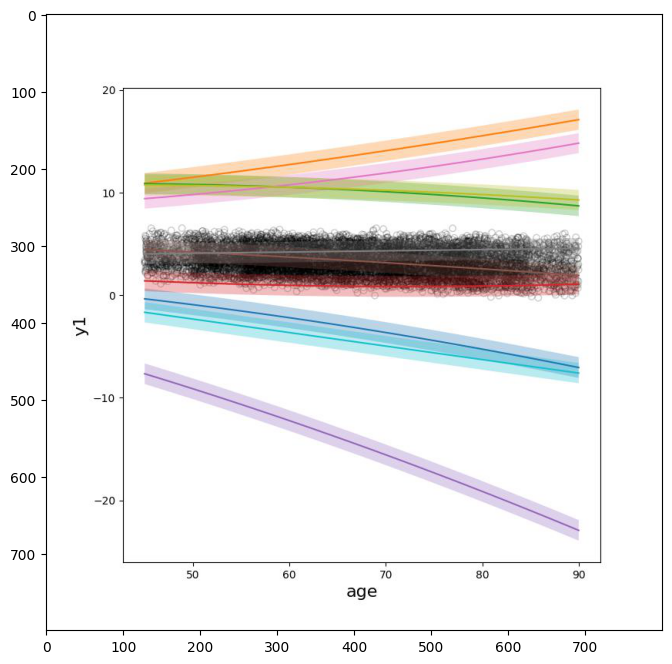

In [52]:
!viz_data_prior_draws --data_file bayes_traj_tutorial_std-0.5_visits-3.csv --prior bayes_traj_tutorial_std-0.5_visits-3_prior_v4.p --num_draws 10 --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.5_visits-3_prior_v4_y1_draws.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_prior_v4_y1_draws.jpg')
plt.imshow(prior_draws_fig)

Saving figure...
Writing provenance info...
DONE.


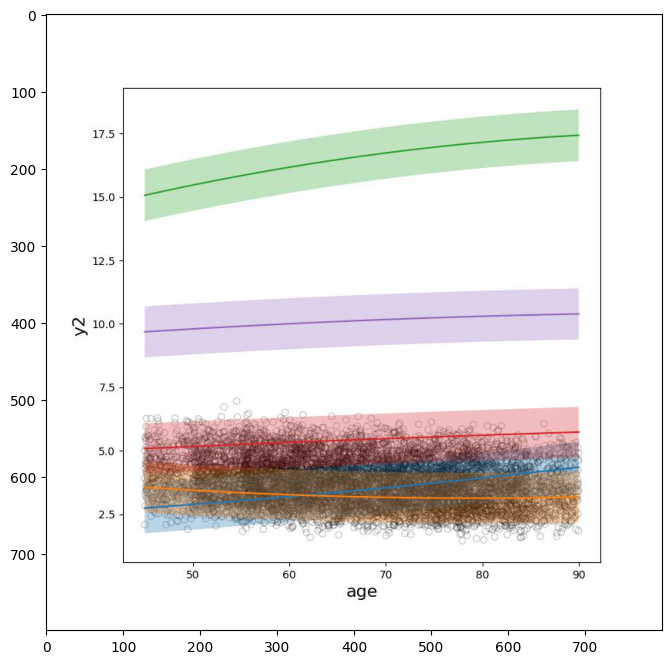

In [53]:
!viz_data_prior_draws --data_file bayes_traj_tutorial_std-0.5_visits-3.csv --prior bayes_traj_tutorial_std-0.5_visits-3_prior_v4.p --num_draws 5 --x_axis age --y_axis y2 --fig_file bayes_traj_tutorial_std-0.5_visits-3_prior_v4_y2_draws.jpg

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_prior_v4_y2_draws.jpg')
plt.imshow(prior_draws_fig)

We could further refine it as described above, but in the interest of demonstrating model comparison, it suffices.

### *bayes_traj_main*: new data, multiple dimensions, different predictors

In [54]:
!bayes_traj_main --in_csv bayes_traj_tutorial_std-0.5_visits-3.csv --prior bayes_traj_tutorial_std-0.5_visits-3_prior_v4.p --targets y1,y2 --groupby id --iters 150 --verbose --out_model bayes_traj_tutorial_std-0.5_visits-3_model_v3.p --num_init_trajs 5

Reading prior...
Reading data...
Fitting...
Initializing parameters...
iter 1, [4938.4 3180.9  668.3    1.8  210.5    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 2, [4515.6 3418.4  697.7    0.   368.3    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 3, [4406.7 3327.9  691.     0.   574.4    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 4, [4294.7 3189.6  675.2    0.   840.6    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 5, [4157.  3058.1  653.4    0.  1131.4    0.

iter 38, [2536.1 3992.1   47.8    0.  2424.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 39, [2522.6 3999.1   49.5    0.  2428.8    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 40, [2505.  4007.6   51.4    0.  2436.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 41, [2481.7 4019.1   53.3    0.  2446.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 42, [2450.5 4041.7   55.1    0.  2452.7    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.   

iter 76, [1919.  4844.6   76.4    0.  2160.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 77, [1917.8 4848.8   76.9    0.  2156.5    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 78, [1916.8 4852.9   77.4    0.  2152.9    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 79, [1916.  4856.9   77.9    0.  2149.3    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 80, [1915.3 4860.6   78.4    0.  2145.7    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.   

iter 114, [1908.  4865.   190.5    0.  2036.4    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 115, [1907.2 4858.9  201.2    0.  2032.7    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 116, [1906.3 4852.2  212.6    0.  2029.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 117, [1905.3 4844.8  224.7    0.  2025.2    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 118, [1904.3 4836.8  237.6    0.  2021.3    0.     0.     0.     0.     0.     0.     0.     0.     0.     

Saving model provenance info...
Traceback (most recent call last):
  File "/opt/anaconda3/envs/pyro_env/bin/bayes_traj_main", line 33, in <module>
    sys.exit(load_entry_point('bayes-traj', 'console_scripts', 'bayes_traj_main')())
  File "/Users/jr555/Downloads/bayes_traj/bayes_traj/bayes_traj_main.py", line 286, in main
    write_provenance_data(op.out_model, generator_args=op,
  File "/opt/anaconda3/envs/pyro_env/lib/python3.10/site-packages/provenance_tools/write_provenance_data.py", line 184, in write_provenance_data
    raise RuntimeError('Repository not up-to-date')
RuntimeError: Repository not up-to-date


Saving figure...
Writing provenance info...
Traceback (most recent call last):
  File "/opt/anaconda3/envs/pyro_env/bin/viz_model_trajs", line 33, in <module>
    sys.exit(load_entry_point('bayes-traj', 'console_scripts', 'viz_model_trajs')())
  File "/Users/jr555/Downloads/bayes_traj/bayes_traj/viz_model_trajs.py", line 118, in main
    write_provenance_data(op.fig_file, generator_args=op, desc=""" """,
  File "/opt/anaconda3/envs/pyro_env/lib/python3.10/site-packages/provenance_tools/write_provenance_data.py", line 184, in write_provenance_data
    raise RuntimeError('Repository not up-to-date')
RuntimeError: Repository not up-to-date


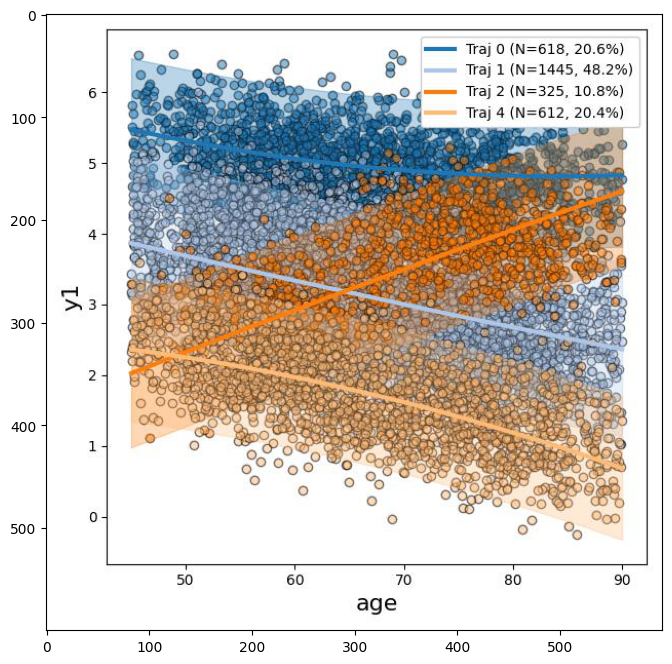

In [55]:
!viz_model_trajs --model bayes_traj_tutorial_std-0.5_visits-3_model_v3.p --x_axis age --y_axis y1 --fig_file bayes_traj_tutorial_std-0.5_visits-3_model_v3_y1_fig.jpg 

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_model_v3_y1_fig.jpg')
plt.imshow(prior_draws_fig)

Saving figure...
Writing provenance info...
DONE.


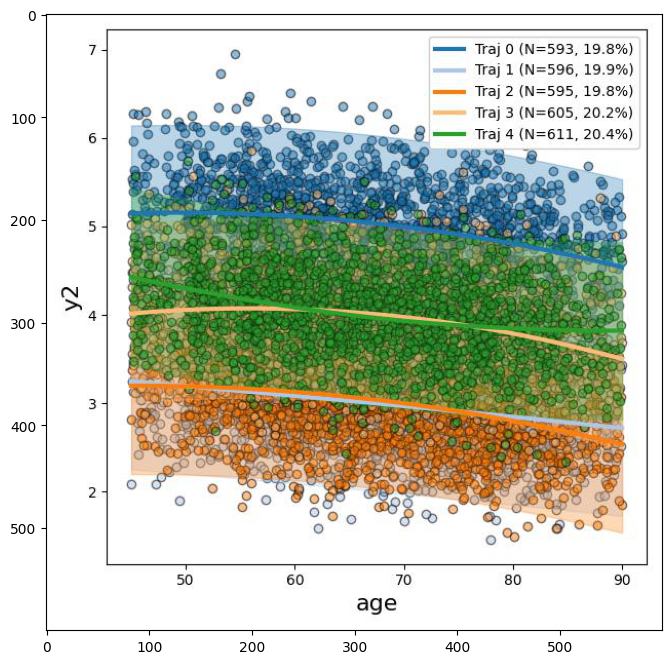

In [66]:
!viz_model_trajs --model bayes_traj_tutorial_std-0.5_visits-3_model_v3.p --x_axis age --y_axis y2 --fig_file bayes_traj_tutorial_std-0.5_visits-3_model_v3_y2_fig.jpg 

prior_draws_fig = plt.imread('bayes_traj_tutorial_std-0.5_visits-3_model_v3_y2_fig.jpg')
plt.imshow(prior_draws_fig)

The addition of the age^2 term enables representation of nonlinearity, which can be seen in these results; in this case, the nonlinearity is an overfit to the date (as we know the underlying trends in this simulated data set are linear).

### *summarize_traj_model*
The *summarize_traj_model* utility allows us to inspect trajectory models quantitatively. Run with the -h flag to see usage information:

In [39]:
!summarize_traj_model -h

usage: summarize_traj_model [-h] --model MODEL [--trajs TRAJS]
                            [--min_traj_prob MIN_TRAJ_PROB] [--hide_ic]

options:
  -h, --help            show this help message and exit
  --model MODEL         Bayesian trajectory model to summarize
  --trajs TRAJS         Comma-separated list of integers indicating
                        trajectories for which to print results. If none
                        specified, results for all trajectories will be
                        printed
  --min_traj_prob MIN_TRAJ_PROB
                        The probability of a given trajectory must be at least
                        this value in order for results to be printed for that
                        trajectory. Value should be between 0 and 1 inclusive.
  --hide_ic             Use this flag to hide compuation and display of
                        information criterai (BIC and WAIC2), which can take
                        several moments to compute.


Lets use this utility to inspect the model that used *intercept*, *age*, and  *age^2* as predictors:

In [40]:
!summarize_traj_model --model bayes_traj_tutorial_std-0.5_visits-3_model_v3.p

Traceback (most recent call last):
  File "/opt/anaconda3/envs/pyro_env/bin/summarize_traj_model", line 33, in <module>
    sys.exit(load_entry_point('bayes-traj', 'console_scripts', 'summarize_traj_model')())
  File "/Users/jr555/Downloads/bayes_traj/bayes_traj/summarize_traj_model.py", line 30, in main
    with open(op.model, 'rb') as f:
FileNotFoundError: [Errno 2] No such file or directory: 'bayes_traj_tutorial_std-0.5_visits-3_model_v3.p'


The print-out shows information for the model as a whole in the 'Summary' section at the top. Included here are three information criterion measures: BIC1, BIC2, and WAIC2. These measures reward goodness of fit while penalizing model complexity. The penalty terms is a function of *N*; BIC1 takes *N* to be the number of observations, while BIC2 takes *N* to be the number of groups. Generally, a higher BIC value is preferred. WAIC2 is an alternative information criterion measure which has been recommended in the Bayesian context; lower WAIC2 scores are preferred.

Below the overall summary is per-trajectory information. This includes posterior estimates for residual precisions and predictor coefficients. Note that STD is not the same as *standard error*, and 95% Cred. Int. (credible interval) is not the same as a *confidence interval*. Rather, these are quantities that describe the Bayesian posterior distribution over these parameters. (Side note: the trajectory fitting routine uses a technique called *variational inference*, which is fast and scales well, but is known to *underestimate* posterior variances. Posterior standard deviations and credible intervals should be interpreted with this in mind). 

Also shown for each trajectory are the *odds of correct classification* and the *average posterior probability of assignment*. A rule of thumb for the odds of correct classification is that it should be greater than 5. For the average posterior probability of assignment, values of .7 or greater for each trajectory are recommended as rules of thumb.

Now let's inspect the model generated using only *intercept* and *age*:

In [69]:
!summarize_traj_model --model bayes_traj_tutorial_std-0.5_visits-3_model_v2.p

                                 Summary                                  
Num. Trajs:         5
Trajectories:       0,1,4,5,6                               
No. Observations:   9000           
No. Groups:         3000           
WAIC2:              27228     
BIC1:               -12765    
BIC2:               -12744    

                         Summary for Trajectory 0                         
No. Observations:                             1779
No. Groups:                                    593
% of Sample:                                  19.8
Odds Correct Classification:                 674.7
Ave. Post. Prob. of Assignment:               0.99

                  Residual STD       Precision Mean      Precision Var    
--------------------------------------------------------------------------
y1                    0.50                4.03               0.0065       
y2                    0.50                4.07               0.0066       

                      coef                ST

As expected, the more parsimonious model (using only *intercept* and *age* as predictors) results in better information criteria scores. 

# Bayesian Trajectory Analysis: Binary Target Variables

We now turn our attention to the case of binary target variables. In this case, the algorithm models the data as a mixture of logistic regressors.

As before, we begin by printing the first few rows of a synthetically generated data set that containts two binary target variables (*y1* and *y2*) and a time variable, *x*. In this data set, there are four distinct trajectories, with 200 individuals in each trajectory and 10 time points per individual. 'sid' is the subject identifier column, 'traj_gt' indicates the ground-truth trajectory assignment, and 'intercept' is a column of 1s. The four trajectories were generated to have the following probability patterns with respect to the time variable, *x*:
* Trajectory 1 -- y1: decreasing, y2: decreasing, shifted left
* Trajectory 2 -- y1: decreasing, y2: decreasing, shifted right
* Trajectory 3 -- y1: increasing, y2: decreasing, shifted left
* Trajectory 4 -- y1: increasing, y2: decreasing, shifted right

In [72]:
df = pd.read_csv('binary_data_4.csv')
df.head(15)

,sid,mu1,mu2,y1,y2,intercept,x,traj_gt
0,0.0,0.994590,0.999554,1,1,1.0,-5.214084,0.0
1,0.0,0.976913,0.998064,1,1,1.0,-3.745119,0.0
2,0.0,0.939964,0.994785,1,1,1.0,-2.750904,0.0
3,0.0,0.789713,0.978610,1,1,1.0,-1.323194,0.0
4,0.0,0.699091,0.965874,1,1,1.0,-0.842974,0.0
5,0.0,0.362511,0.873859,1,1,1.0,0.564483,0.0
6,0.0,0.153625,0.688593,0,0,1.0,1.706451,0.0
7,0.0,0.061672,0.444659,0,1,1.0,2.722275,0.0
8,0.0,0.021875,0.214112,0,0,1.0,3.800312,0.0
9,0.0,0.005367,0.061681,0,0,1.0,5.222111,0.0


### Prior Generation

The procedure for generating priors in this case proceeds as above. Here we will specifically set the priors over the predictor coefficients to be zero-centered Gaussian distributions with unit variance:

In [86]:
!generate_prior --num_trajs 4 --preds intercept,x --targets y1,y2 --in_data binary_data_4.csv  --coef y1,intercept,0,1 --coef y1,x,0,1 --coef y2,intercept,0,1 --coef y2,x,0,1 --out_file binary_data_4_prior.p --groupby sid

Reading data...
Optimization terminated successfully.
         Current function value: 0.693140
         Iterations 3
Optimization terminated successfully.
         Current function value: 0.466741
         Iterations 6
---------- Prior Info ----------
alpha: 5.51e-01
 
y1 intercept (mean, std): (0.00e+00, 1.00e+00)
y1 x (mean, std): (0.00e+00, 1.00e+00)
 
y2 intercept (mean, std): (0.00e+00, 1.00e+00)
y2 x (mean, std): (0.00e+00, 1.00e+00)


As before, let's visualize draws from this prior:

Saving figure...
Writing provenance info...
DONE.


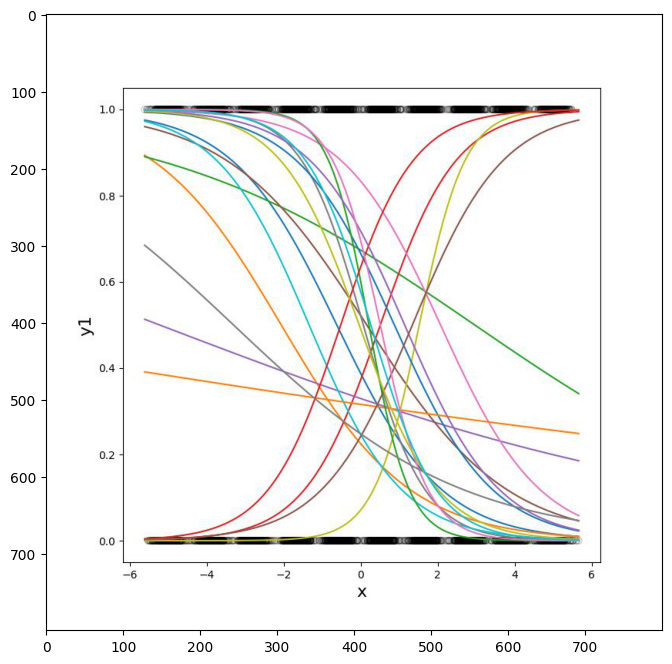

In [87]:
!viz_data_prior_draws --data_file binary_data_4.csv --prior binary_data_4_prior.p --num_draws 20 --x_axis x  --y_axis y1 --fig_file binary_data_4_prior_draws.jpg

prior_draws_fig = plt.imread('binary_data_4_prior_draws.jpg')
plt.imshow(prior_draws_fig)

### Model Fitting and Visualization

Model fitting proceeds as in the continuous case. Here we will fit using both target variables.

In [90]:
!bayes_traj_main --in_csv binary_data_4.csv --prior binary_data_4_prior.p --targets y1,y2 --groupby sid --out_model binary_data_4_model.p --verbose --iters 50 --alpha .55

Reading prior...
Reading data...
Fitting...
Initializing parameters...
iter 1, [6560.7 1215.2  117.9  106.2    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 2, [5700.8 2099.2  122.8   77.2    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 3, [4643.9 3260.5   60.5   35.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 4, [4188.2 3676.3   44.6   90.9    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 5, [3480.1 3552.   216.9  751.     0.     0.

iter 38, [1964.9 1997.7 2035.1 2002.3    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 39, [1964.3 2002.2 2035.7 1997.8    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 40, [1967.4 1993.8 2032.6 2006.2    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 41, [1964.6 1998.9 2035.4 2001.1    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0. ]
iter 42, [1965.8 1996.8 2034.2 2003.2    0.     0.     0.     0.     0.     0.     0.     0.     0.     0.     0.   

Finally, let's visualize the results and inspect the *y1* and *y2* trends:

Saving figure...
Writing provenance info...
DONE.


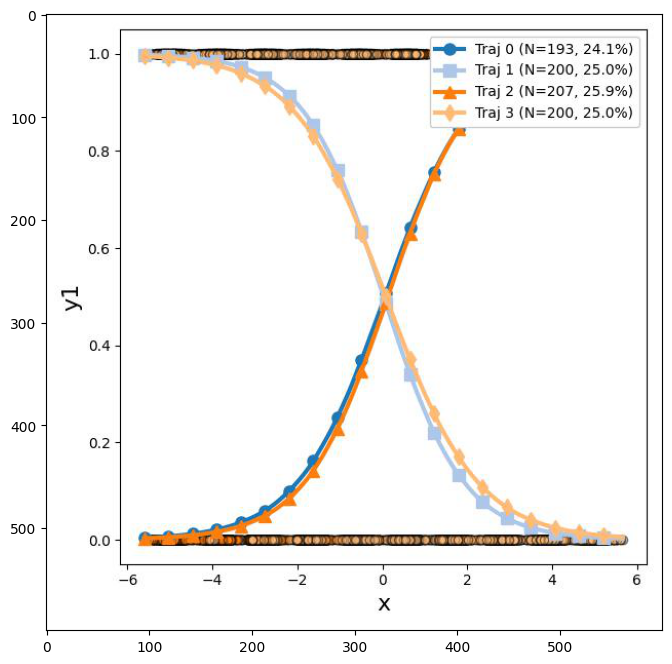

In [92]:
!viz_model_trajs --model binary_data_4_model.p --x_axis x --y_axis y1 --fig_file binary_data_4_model_y1_fig.jpg --traj_markers o,s,^,d

fig = plt.imread('binary_data_4_model_y1_fig.jpg')
plt.imshow(fig)

Saving figure...
Writing provenance info...
DONE.


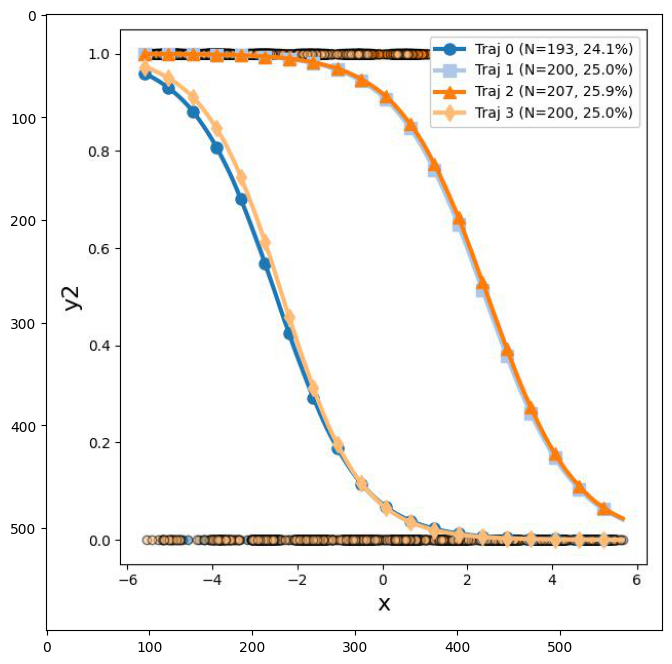

In [93]:
!viz_model_trajs --model binary_data_4_model.p --x_axis x --y_axis y2 --fig_file binary_data_4_model_y2_fig.jpg --traj_markers o,s,^,d

fig = plt.imread('binary_data_4_model_y2_fig.jpg')
plt.imshow(fig)

The detected trajectories capture the underlying trends. Note that the trajectory numbers assigned by the algorithm are arbitrary.